# **Data Collection**

In [1]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install -q kagglehub

In [3]:
from google.colab import files
import os
import kagglehub

# Step 1: Upload kaggle.json manually
print("📂 Please upload your kaggle.json file:")
uploaded = files.upload()

# Ensure the uploaded file exists
if "kaggle.json" not in uploaded:
    print("❌ kaggle.json upload failed. Please try again.")
else:
    # Step 2: Move the file to the correct location
    !mkdir -p /root/.config/kaggle
    !mv kaggle.json /root/.config/kaggle/

    # Step 3: Set proper permissions (read and write)
    !chmod 600 /root/.config/kaggle/kaggle.json

    # Step 4: Verify that the file exists
    if os.path.exists("/root/.config/kaggle/kaggle.json"):
        print("✅ kaggle.json uploaded and set up correctly!")
    else:
        print("❌ kaggle.json upload failed. Please check the file path.")

# Step 5: download dataset
try:
    dataset_path = kagglehub.dataset_download("evilspirit05/cocococo-dataset")
    print("✅ Dataset downloaded successfully!")
    print("📂 Path to dataset files:", dataset_path)

    # Step 7: Move dataset to /content/{dataset-name} for easier access
    target_path = os.path.join(os.getcwd(), "coco_dataset")
    !mkdir -p {target_path}  # Ensure target directory exists
    !cp -r {dataset_path}/* {target_path}/

    print(f"✅ Dataset moved to {target_path}")
    print("📂 Final Dataset contents:", os.listdir(target_path))

except Exception as e:
    print("❌ Error downloading dataset:", e)

📂 Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json
✅ kaggle.json uploaded and set up correctly!
✅ Dataset downloaded successfully!
📂 Path to dataset files: /kaggle/input/cocococo-dataset
✅ Dataset moved to /content/coco_dataset
📂 Final Dataset contents: ['export', 'README.roboflow.txt', 'README.dataset.txt']


In [4]:
import os

base_path = '/content/coco_dataset'  # adjust if needed
export_dir = os.path.join(base_path, 'export')

non_image_files = []

# Walk through export folder
for root, dirs, files in os.walk(export_dir):
    for file in files:
        if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            relative_path = os.path.relpath(os.path.join(root, file), base_path)
            non_image_files.append(relative_path)

# Show all non-image files
if non_image_files:
    print("📄 Non-image files found in 'export':")
    for f in non_image_files:
        print(f"- {f}")
else:
    print("✅ No non-image files found in 'export'")


📄 Non-image files found in 'export':
- export/_annotations.coco.json


In [5]:
import shutil

# Loop through non_image_files and move _annotations.coco.json
for file_path in non_image_files:
    filename = os.path.basename(file_path)
    if filename == '_annotations.coco.json':
        src_path = os.path.join(base_path, file_path)
        dest_path = os.path.join(base_path, filename)
        shutil.move(src_path, dest_path)
        print(f"✅ Moved {src_path} → {dest_path}")


✅ Moved /content/coco_dataset/export/_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


In [6]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

verifing data

In [7]:
# Count the number of files
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 29800


In [8]:
import json

valid_extensions = {".jpg", ".jpeg", ".png", ".bmp"}

# Check if all files are images
non_image_files = [file for file in os.listdir(images_path)
                   if not any(file.lower().endswith(ext) for ext in valid_extensions)]

if non_image_files:
    print(f"Found non-image files: {non_image_files}")
else:
    print("All files are valid images!")


All files are valid images!


Deleting Unannotated images

In [9]:
# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get all annotated image IDs
annotated_image_ids = {ann['image_id'] for ann in data['annotations']}

# Get all image file names
image_files = {img['file_name']: img['id'] for img in data['images']}

# Identify unannotated images
unannotated = [file for file, img_id in image_files.items() if img_id not in annotated_image_ids]

print(f"\nFound {len(unannotated)} unannotated images.")

# Delete unannotated images
for file in unannotated:
    try:
        file_path = os.path.join(images_path, file)
        os.remove(file_path)
        print(f"Deleted unannotated image: {file}")
    except FileNotFoundError:
        print(f"File not found: {file}")

print("\nDeletion complete!")


Found 3500 unannotated images.
Deleted unannotated image: 1478895384169910818_jpg.rf.684000e1e8f68a2e723485d1d649abb6.jpg
Deleted unannotated image: 1478897734455141074_jpg.rf.686509e5a56a940593a1e56d9ead181e.jpg
Deleted unannotated image: 1478897676755018566_jpg.rf.68749568ca05e6b2b439da2b72d89f85.jpg
Deleted unannotated image: 1478898164636421519_jpg.rf.68c90be17d46a29254f211e200de142b.jpg
Deleted unannotated image: 1478898165208043913_jpg.rf.68f3924e2d2a0796c4373829484f3c54.jpg
Deleted unannotated image: 1478895940606118436_jpg.rf.68xNq7HL27EKmRnrGgpz.jpg
Deleted unannotated image: 1478895984023324459_jpg.rf.691058100352b5ffb50a8eedb5f95f1a.jpg
Deleted unannotated image: 1478896046293760222_jpg.rf.692464726c52b3e2ff622b214ac91978.jpg
Deleted unannotated image: 1478896142270652043_jpg.rf.692d6caddfd1fda42650b775879d4be0.jpg
Deleted unannotated image: 1478901062218872908_jpg.rf.6945df45ba4ddc24f3c58b3d953279b6.jpg
Deleted unannotated image: 1478895838344289010_jpg.rf.6971448a94c306f7

In [10]:
# check after deleting unannotated
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 26300


modify json file after deleting unannotated

In [11]:
import json
import os

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get list of existing images in the directory
existing_images = set(os.listdir(images_path))

# Filter the images list to include only existing files
filtered_images = [img for img in data['images'] if img['file_name'] in existing_images]

# Get the valid image IDs after filtering
valid_image_ids = {img['id'] for img in filtered_images}

# Filter annotations to keep only those belonging to valid images
filtered_annotations = [ann for ann in data['annotations'] if ann['image_id'] in valid_image_ids]

# Update the data dictionary
data['images'] = filtered_images
data['annotations'] = filtered_annotations

# Save the updated JSON file
updated_file = "updated_annotations.coco.json"
with open(updated_file, "w") as outfile:
    json.dump(data, outfile)

print(f"✅ Updated annotation file saved as {updated_file}")

✅ Updated annotation file saved as updated_annotations.coco.json


In [12]:
import os
import shutil

# Define paths
source_file = '/content/updated_annotations.coco.json'  # Current location
destination_dir = '/content/coco_dataset'  # Target directory
destination_file = os.path.join(destination_dir, '_annotations.coco.json')  # New path

# Check if source exists
if not os.path.exists(source_file):
    raise FileNotFoundError(f"Source file not found: {source_file}")

# Ensure destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Move the file (will overwrite if exists)
shutil.move(source_file, destination_file)

print(f"Successfully moved:\n{source_file} → {destination_file}")

Successfully moved:
/content/updated_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


**paths after deleting unannotated images and modifing json**

In [13]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

In [14]:
# double check
from collections import defaultdict

with open(json_path, 'r') as f:
    coco_data = json.load(f)

images = coco_data['images']
annotations = coco_data['annotations']

# Map image_id to number of annotations
image_id_to_ann_count = defaultdict(int)
for ann in annotations:
    image_id_to_ann_count[ann['image_id']] += 1

# Check for unannotated images
annotated = []
unannotated = []

for img in images:
    if image_id_to_ann_count[img['id']] > 0:
        annotated.append(img)
    else:
        unannotated.append(img)

print(f"✅ Annotated images: {len(annotated)}")
print(f"❌ Unannotated images: {len(unannotated)}")

✅ Annotated images: 26300
❌ Unannotated images: 0


**EDA**

display classes

In [ ]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print basic structure
print("Keys:", data.keys())

# Print a few image entries
print("\nSample Image Entry:")
for image in data["images"][:3]:  # Adjust the number as needed
    print(image)

# Print a few annotation entries
print("\nSample Annotation Entry:")
for annotation in data["annotations"][:3]:
    print(annotation)

# Print category names
print("\nCategories:")
for category in data["categories"]:
    print(category)

Keys: dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

Sample Image Entry:
{'id': 0, 'license': 1, 'file_name': '1478897026627294725_jpg.rf.6828a4e821cbab4c2c277d74df291f00.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 2, 'license': 1, 'file_name': '1478900859981702684_jpg.rf.6830635c7d9197475638f0818f5dd103.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 3, 'license': 1, 'file_name': '1478899989907374870_jpg.rf.684aa8281432f9513dad8d91c54a1346.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}

Sample Annotation Entry:
{'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [140, 262, 21, 25.5], 'area': 535.5, 'segmentation': [], 'iscrowd': 0}
{'id': 1, 'image_id': 0, 'category_id': 2, 'bbox': [266, 231, 24, 95.5], 'area': 2292, 'segmentation': [], 'iscrowd': 0}
{'id': 2, 'image_id': 0, 'category_id': 2, 'bbox': [271, 241, 17, 76], 'area': 1292, 'segmentati

In [ ]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print all class names
print("Classes:")
for category in data["categories"]:
    print(f"ID: {category['id']}: {category['name']}")

Classes:
ID: 0: obstacles
ID: 1: biker
ID: 2: car
ID: 3: pedestrian
ID: 4: trafficLight
ID: 5: trafficLight-Green
ID: 6: trafficLight-GreenLeft
ID: 7: trafficLight-Red
ID: 8: trafficLight-RedLeft
ID: 9: trafficLight-Yellow
ID: 10: trafficLight-YellowLeft
ID: 11: truck


In [ ]:
sample_image = data['images'][0]
print(json.dumps(sample_image, indent=2))


{
  "id": 0,
  "license": 1,
  "file_name": "1478897026627294725_jpg.rf.6828a4e821cbab4c2c277d74df291f00.jpg",
  "height": 512,
  "width": 512,
  "date_captured": "2021-06-09T12:24:25+00:00"
}


In [ ]:
import json

# Load COCO annotations
json_path = "/content/coco_dataset/_annotations.coco.json"
with open(json_path, 'r') as f:
    coco_data = json.load(f)

# Count number of annotations (each corresponds to a bounding box/object)
category_ids = set(ann['category_id'] for ann in coco_data['annotations'])
print(len(category_ids))  # Number of unique object types used

11


In [ ]:
import json

json_path = "/content/coco_dataset/_annotations.coco.json"
# Load COCO annotations
with open(json_path, 'r') as f:
    coco_data = json.load(f)
annotations = coco_data['annotations']
print("\nSample bounding boxes (in COCO format [x_min, y_min, width, height]):")
for i, ann in enumerate(annotations[:5]):
    print(f"{i+1}: {ann['bbox']}")

Number of bounding boxes: 194539

Sample bounding boxes (in COCO format [x_min, y_min, width, height]):
1: [140, 262, 21, 25.5]
2: [266, 231, 24, 95.5]
3: [271, 241, 17, 76]
4: [280, 220, 89.5, 121]
5: [291, 247, 79, 83.5]


In [ ]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

 Class Distribution

🔍 Analyzing Class Distribution...


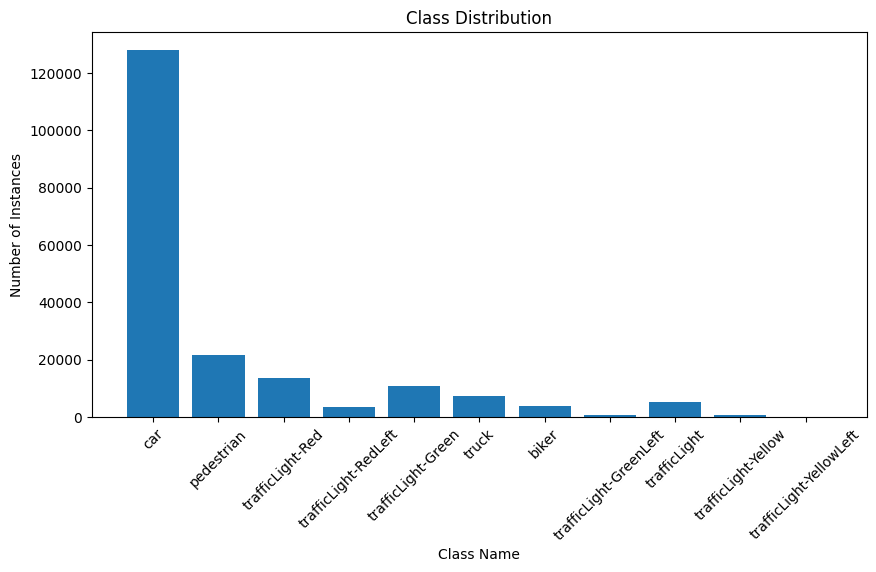

In [ ]:
print("🔍 Analyzing Class Distribution...")
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

# Map category IDs to names
class_names = {cat['id']: cat['name'] for cat in data['categories']}

# Plot the class distribution
plt.figure(figsize=(10, 5))
plt.bar([class_names[cid] for cid in class_counts.keys()], class_counts.values())
plt.title("Class Distribution")
plt.xlabel("Class Name")
plt.ylabel("Number of Instances")
plt.xticks(rotation=45)
plt.show()


size checker

In [ ]:
# Image Dimension Analysis
print("\n📏 Analyzing Image Dimensions...")
dimensions = []
for img in data['images']:
    dimensions.append((img['width'], img['height']))

# Display common dimensions
dim_counts = Counter(dimensions)
print("Most common dimensions:")
for dim, count in dim_counts.most_common(5):
    print(f"Dimensions: {dim}, Count: {count}")


📏 Analyzing Image Dimensions...
Most common dimensions:
Dimensions: (512, 512), Count: 26300


Quality Checker

In [ ]:
print("\n Image Quality checking")
low_quality = [img for img in data['images'] if img['width'] < 300 or img['height'] < 300]
print(f"Number of low-quality images (resolution < 300x300): {len(low_quality)}")
if low_quality:
    print("Sample low-quality images:", [img['file_name'] for img in low_quality[:5]])


 Image Quality checking
Number of low-quality images (resolution < 300x300): 0


In [ ]:
pip install opencv-python scikit-image matplotlib

Analyzing images: 100%|██████████| 200/200 [00:03<00:00, 60.26it/s]


Average blur (variance of Laplacian): 936.91
Average estimated noise: 0.5832


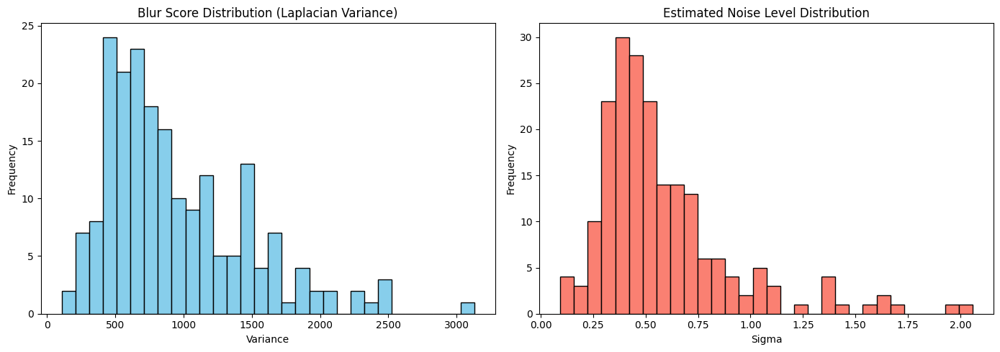

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import estimate_sigma
import random
from tqdm import tqdm

# ---------- CONFIG ----------
images_path = "/content/coco_dataset/export"
sample_size = 200  # Number of images to analyze
random.seed(42)

# ---------- FUNCTIONS ----------

def calculate_blur(image):
    """Calculate blur using the variance of Laplacian."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def estimate_noise(image):
    """Estimate noise standard deviation using skimage."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sigma_est = estimate_sigma(gray, channel_axis=None, average_sigmas=True)
    return sigma_est

def batch_analyze_images(folder_path, sample_size=100):
    all_images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))]
    selected_images = random.sample(all_images, min(sample_size, len(all_images)))

    blur_scores = []
    noise_levels = []

    for filename in tqdm(selected_images, desc="Analyzing images"):
        try:
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            blur = calculate_blur(img)
            noise = estimate_noise(img)

            blur_scores.append(blur)
            noise_levels.append(noise)
        except Exception as e:
            print(f"Error processing {filename}: {e}")

    return blur_scores, noise_levels

def plot_distributions(blur_scores, noise_levels):
    """Plot blur and noise distributions."""
    plt.figure(figsize=(14, 5))

    # Blur distribution
    plt.subplot(1, 2, 1)
    plt.hist(blur_scores, bins=30, color='skyblue', edgecolor='black')
    plt.title('Blur Score Distribution (Laplacian Variance)')
    plt.xlabel('Variance')
    plt.ylabel('Frequency')

    # Noise distribution
    plt.subplot(1, 2, 2)
    plt.hist(noise_levels, bins=30, color='salmon', edgecolor='black')
    plt.title('Estimated Noise Level Distribution')
    plt.xlabel('Sigma')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# ---------- EXECUTION ----------

blur_scores, noise_levels = batch_analyze_images(images_path, sample_size=sample_size)

print(f"Average blur (variance of Laplacian): {np.mean(blur_scores):.2f}")
print(f"Average estimated noise: {np.mean(noise_levels):.4f}")

plot_distributions(blur_scores, noise_levels)


more visualizations

In [ ]:
import random
import matplotlib.pyplot as plt
import cv2
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import seaborn as sns
from IPython.display import display

# Display settings for better visuals
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 14})

# Load the updated COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

In [ ]:
# Helper function to plot images with bounding boxes
def plot_image_with_boxes(image_path, annotations):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    for ann in annotations:
        bbox = ann['bbox']
        x, y, width, height = bbox
        x2, y2 = x + width, y + height
        label = class_names[ann['category_id']]
        # Draw bounding box
        draw.rectangle([x, y, x2, y2], outline="red", width=3)
        # Draw label with larger font size
        draw.text((x, y), label, fill="yellow", font=None, anchor=None, size=24)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.show()


🖼️ Showing Random Samples with Bounding Boxes
Image: 1478900957671553561_jpg.rf.GZVdKZdkyUXLyD18XyCm.jpg


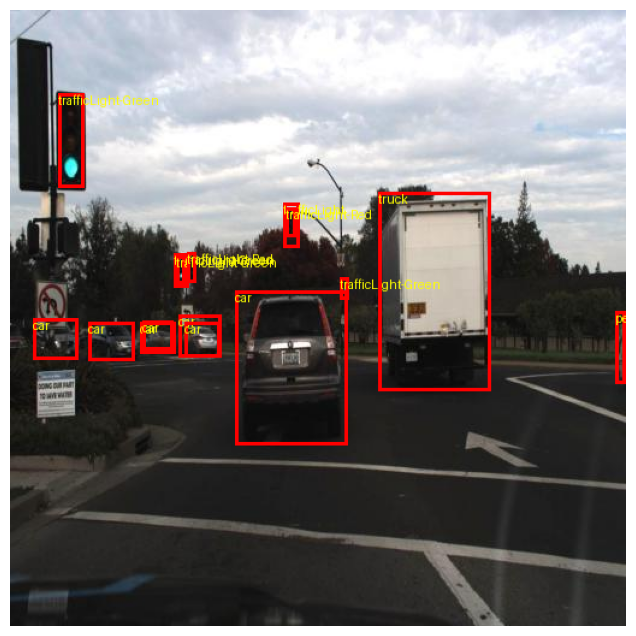

Image: 1478898098938399867_jpg.rf.o28rtqTW1Yc1p2Y9s66X.jpg


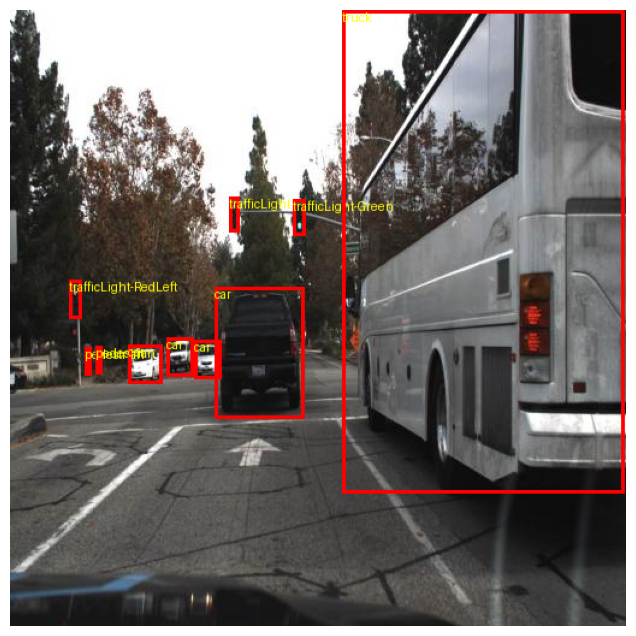

Image: 1478898890174690383_jpg.rf.JGodtNDvtFXJdeRJXbaR.jpg


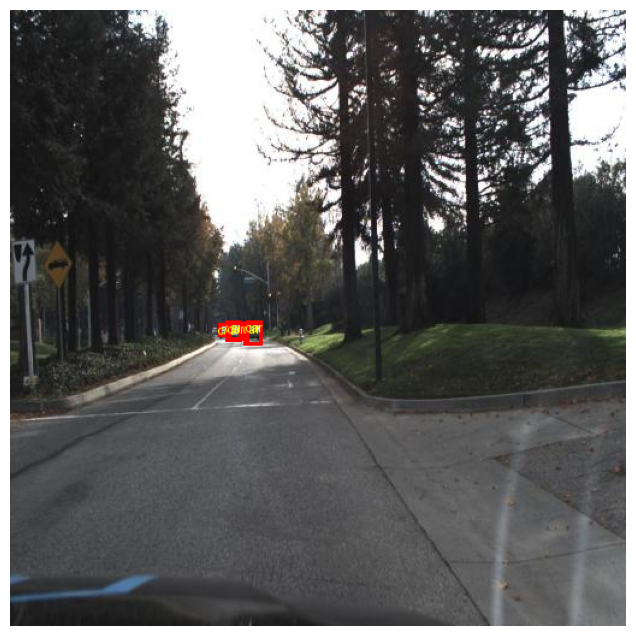

In [ ]:
print("\n🖼️ Showing Random Samples with Bounding Boxes")
sample_images = random.sample(data['images'], 3)  # Display 3 random images
for img in sample_images:
    image_path = os.path.join(images_path, img['file_name'])
    annotations = [ann for ann in data['annotations'] if ann['image_id'] == img['id']]
    print(f"Image: {img['file_name']}")
    plot_image_with_boxes(image_path, annotations)

Bounding Boxes Analysis


 Analyzing Bounding Boxes


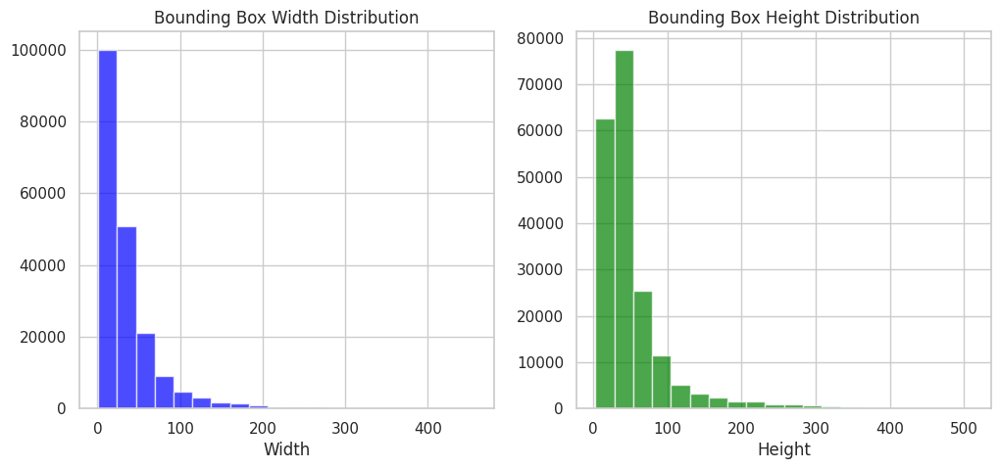

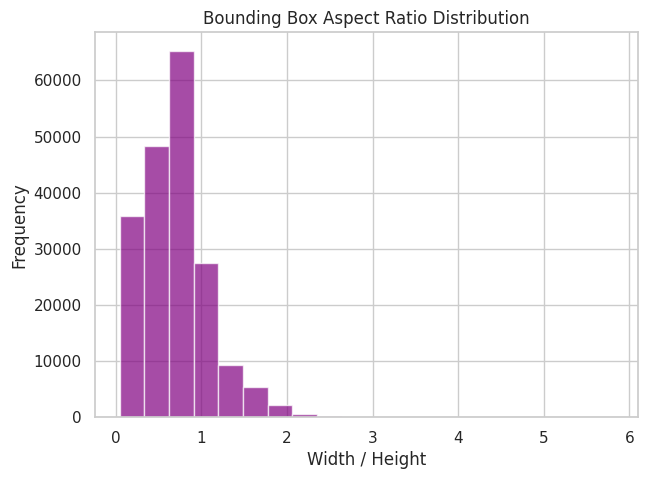

In [ ]:
print("\n Analyzing Bounding Boxes")
bbox_dims = [(ann['bbox'][2], ann['bbox'][3]) for ann in data['annotations']]
bbox_widths, bbox_heights = zip(*bbox_dims)

# Plot bounding box width and height distributions
plt.figure(figsize=(12, 5))

# Width Distribution
plt.subplot(1, 2, 1)
plt.hist(bbox_widths, bins=20, color='blue', alpha=0.7)
plt.title("Bounding Box Width Distribution")
plt.xlabel("Width")

# Height Distribution
plt.subplot(1, 2, 2)
plt.hist(bbox_heights, bins=20, color='green', alpha=0.7)
plt.title("Bounding Box Height Distribution")
plt.xlabel("Height")
plt.show()

# Aspect Ratio Analysis
aspect_ratios = [w / h for w, h in bbox_dims]
plt.figure(figsize=(7, 5))
plt.hist(aspect_ratios, bins=20, color='purple', alpha=0.7)
plt.title("Bounding Box Aspect Ratio Distribution")
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.show()

In [ ]:
import json

# Path to your COCO JSON file
json_path = "/content/coco_dataset/_annotations.coco.json"

# Load JSON annotations
with open(json_path, 'r') as f:
    coco_data = json.load(f)

# 'annotations' field contains all bounding boxes
total_bboxes = len(coco_data['annotations'])

print(f"✅ Total number of bounding boxes in the dataset: {total_bboxes}")


✅ Total number of bounding boxes in the dataset: 194539


Spatial Distribution Analysis

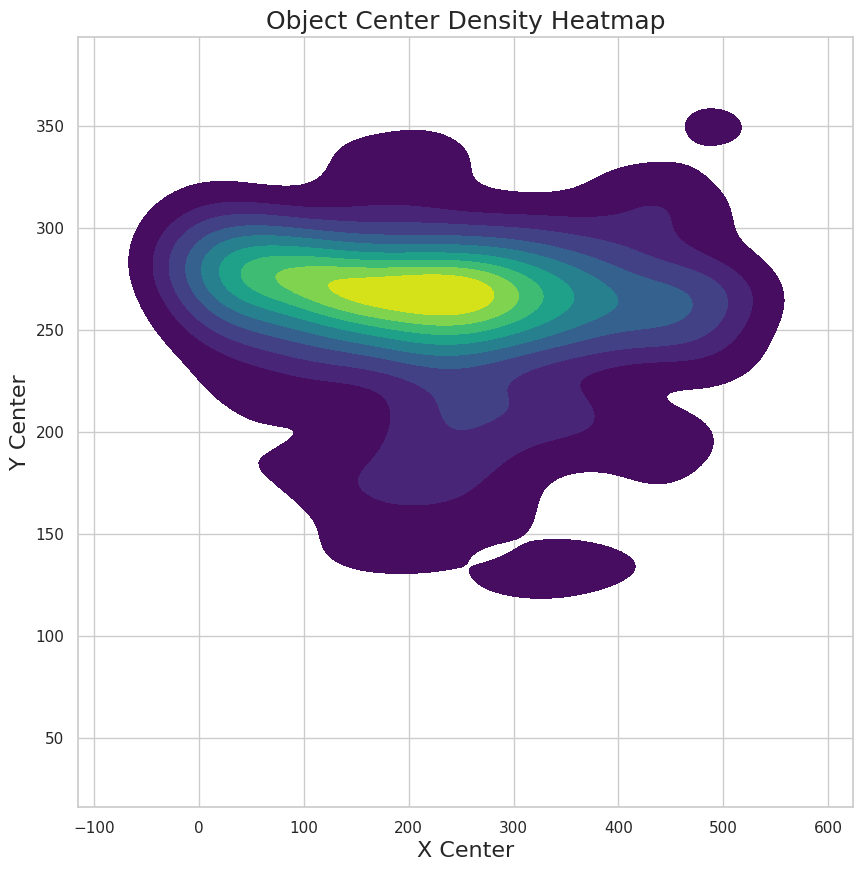

<ipython-input-26-fd36e0cfaa90>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y='width', palette='Set2')


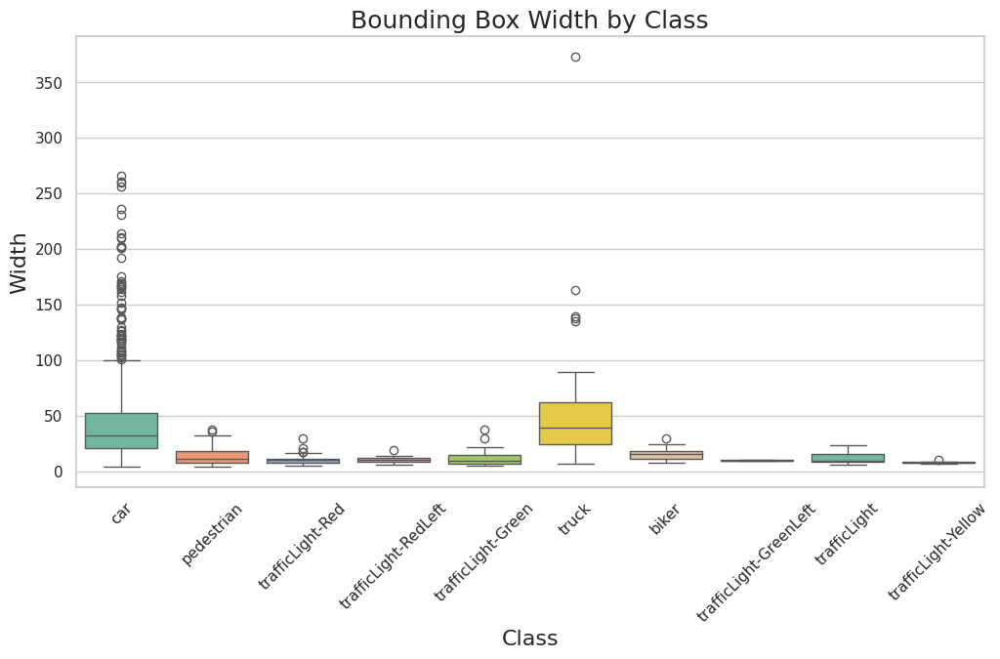

In [ ]:
def analyze_spatial_distribution(json_path=json_path, sample_size=1000):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return None

    # Prepare data
    spatial_data = []
    for ann in data['annotations'][:sample_size]:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            x, y, w, h = ann['bbox']
            spatial_data.append({
                'class': cat_name,
                'x_center': x + w / 2,
                'y_center': y + h / 2,
                'width': w,
                'height': h
            })
        except StopIteration:
            print(f"⚠️ Category ID {ann['category_id']} not found in categories")
            continue

    df = pd.DataFrame(spatial_data)
    if df.empty:
        print("❌ No valid annotations found.")
        return None

    # Spatial heatmap
    plt.figure(figsize=(10, 10))
    sns.kdeplot(data=df, x='x_center', y='y_center', fill=True, cmap='viridis')
    plt.title('Object Center Density Heatmap', fontsize=18)
    plt.xlabel('X Center', fontsize=16)
    plt.ylabel('Y Center', fontsize=16)
    plt.show()

    # Size distribution
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x='class', y='width', palette='Set2')
    plt.title('Bounding Box Width by Class', fontsize=18)
    plt.xlabel('Class', fontsize=16)
    plt.ylabel('Width', fontsize=16)
    plt.xticks(rotation=45)
    plt.show()

    return df

# Run the analysis on the entire dataset
spatial_df = analyze_spatial_distribution()


Advanced Statistics Calculation

In [ ]:
def get_advanced_stats(data):
    class_counts = defaultdict(int)
    size_data = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] += 1

            # Bounding box size
            width = ann['bbox'][2]
            height = ann['bbox'][3]
            size_data[cat_name].append(width * height)
        except StopIteration:
            continue

    # Create DataFrame - ensure numerical values
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'avg_size': [np.mean(size_data[c]) if size_data[c] else 0 for c in class_counts]
    }).sort_values('count', ascending=False)

    # Convert avg_size to float explicitly
    df['avg_size'] = df['avg_size'].astype(float)

    # Display with gradient coloring
    return df.style.background_gradient(cmap='Blues', subset=['count', 'avg_size']).format({
        'count': "{:d}",
        'avg_size': "{:.2f}"
    })

# Load the entire data
with open(json_path) as f:
    data = json.load(f)

# Display advanced statistics for the entire dataset
advanced_stats = get_advanced_stats(data)
display(advanced_stats)

,class,count,avg_size
0,car,127873,4087.01
1,pedestrian,21491,1426.20
2,trafficLight-Red,13673,396.76
4,trafficLight-Green,10838,308.70
5,truck,7194,8258.77
8,trafficLight,5101,630.62
6,biker,3704,1567.55
3,trafficLight-RedLeft,3482,308.63
7,trafficLight-GreenLeft,614,330.29
9,trafficLight-Yellow,541,347.25


Bias Detection and Visualization



🔍 Class Representation:


,class,count,percentage,avg_size
0,car,127873,65.731293,4087.007779
1,pedestrian,21491,11.047142,1426.195942
2,trafficLight-Red,13673,7.028411,396.755713
4,trafficLight-Green,10838,5.571119,308.702008
5,truck,7194,3.697973,8258.766767
8,trafficLight,5101,2.622096,630.617981
6,biker,3704,1.903988,1567.550964
3,trafficLight-RedLeft,3482,1.789872,308.634486
7,trafficLight-GreenLeft,614,0.315618,330.293338
9,trafficLight-Yellow,541,0.278093,347.246753


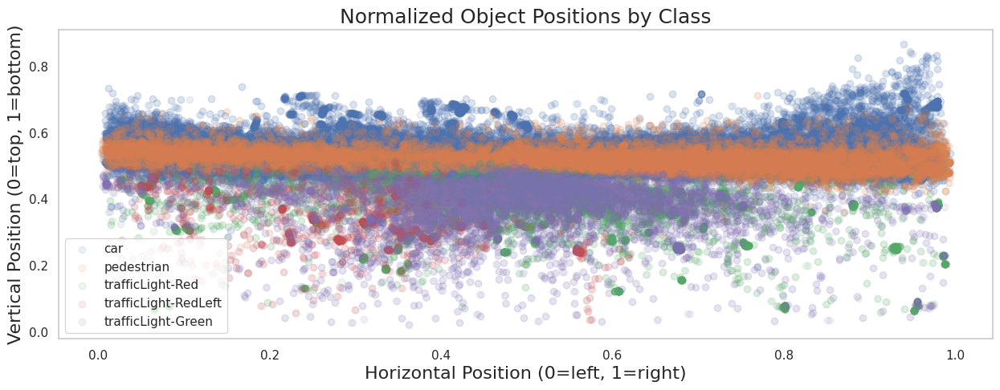

In [ ]:
def detect_biases(json_path=json_path):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return

    # Class distribution
    class_counts = {}
    size_dist = defaultdict(list)
    pos_dist = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] = class_counts.get(cat_name, 0) + 1

            # Size distribution
            area = ann['bbox'][2] * ann['bbox'][3]
            size_dist[cat_name].append(area)

            # Position distribution
            img = next(i for i in data['images'] if i['id'] == ann['image_id'])
            x_center = (ann['bbox'][0] + ann['bbox'][2] / 2) / img['width']
            y_center = (ann['bbox'][1] + ann['bbox'][3] / 2) / img['height']
            pos_dist[cat_name].append((x_center, y_center))
        except StopIteration:
            continue

    # Class imbalance analysis
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'percentage': [100 * c / sum(class_counts.values()) for c in class_counts.values()],
        'avg_size': [np.mean(size_dist[k]) for k in class_counts]
    }).sort_values('count', ascending=False)

    print("\n🔍 Class Representation:")
    display(df.style.background_gradient(subset=['count', 'percentage'], cmap='YlOrRd'))

    # Positional bias visualization
    plt.figure(figsize=(15, 5))
    for i, (cls, positions) in enumerate(pos_dist.items()):
        if i >= 5: break  # Top 5 classes for clarity
        x, y = zip(*positions)
        plt.scatter(x, y, alpha=0.1, label=cls)

    plt.title('Normalized Object Positions by Class', fontsize=18)
    plt.xlabel('Horizontal Position (0=left, 1=right)', fontsize=16)
    plt.ylabel('Vertical Position (0=top, 1=bottom)', fontsize=16)
    plt.legend()
    plt.grid()
    plt.show()

# Run bias detection for the entire dataset
detect_biases()

Quality Metrics Analysis

In [ ]:
def advanced_quality_metrics(json_path=json_path):

    try:
        # Load annotations with error handling
        with open(json_path) as f:
            data = json.load(f)
    except Exception as e:
        print(f"❌ Error loading annotations: {e}")
        return

    metrics = {
        'images_with_small_objects': 0,
        'images_with_crowding': 0,
        'class_cooccurrence': defaultdict(int),
        'total_images_processed': 0
    }

    # Analyze images
    sample_images = data['images'][:min(1000, len(data['images']))]
    if not sample_images:
        print("❌ No images found in annotations")
        return

    for img in sample_images:
        metrics['total_images_processed'] += 1
        img_annots = [a for a in data['annotations'] if a['image_id'] == img['id']]
        if not img_annots:
            continue

        # Small objects check
        small_objs = sum((a['bbox'][2] * a['bbox'][3] < 32 * 32) for a in img_annots)
        if small_objs > 0:
            metrics['images_with_small_objects'] += 1

        # Crowding check
        if len(img_annots) > 10:
            metrics['images_with_crowding'] += 1

        # Class co-occurrence
        classes = {a['category_id'] for a in img_annots}
        if len(classes) > 1:
            for cls in classes:
                metrics['class_cooccurrence'][cls] += 1

    # Print the quality report
    print(f"\n🔍 Quality Report for the Entire Dataset:")
    print(f"Images processed: {metrics['total_images_processed']}")
    if metrics['total_images_processed'] > 0:
        print(f"- Images with small objects: {100 * metrics['images_with_small_objects'] / metrics['total_images_processed']:.1f}%")
        print(f"- Crowded images: {100 * metrics['images_with_crowding'] / metrics['total_images_processed']:.1f}%")
    else:
        print("❌ No valid images with annotations found")

    # Co-occurrence analysis
    if metrics['class_cooccurrence']:
        cooccur_data = []
        for cls, count in metrics['class_cooccurrence'].items():
            try:
                cat_name = next(c['name'] for c in data['categories'] if c['id'] == cls)
                cooccur_data.append((cat_name, count))
            except StopIteration:
                continue
        cooccur_df = pd.DataFrame(cooccur_data, columns=['Class', 'Co-occurrence Count']).sort_values('Co-occurrence Count', ascending=False)
        print("\n📊 Most Common Co-occurring Classes:")
        display(cooccur_df.head(10))
    else:
        print("❌ No multi-class images found in the sample")


advanced_quality_metrics()



🔍 Quality Report for the Entire Dataset:
Images processed: 1000
- Images with small objects: 90.5%
- Crowded images: 22.0%

📊 Most Common Co-occurring Classes:


,Class,Co-occurrence Count
0,car,569
1,pedestrian,262
2,trafficLight-Red,197
4,truck,177
5,trafficLight-Green,128
8,trafficLight,102
6,biker,88
3,trafficLight-RedLeft,86
7,trafficLight-GreenLeft,12
9,trafficLight-Yellow,8


REPORT

In [ ]:
# 1: Analyze Entire Dataset

def analyze_entire_dataset(base_path='/content/coco_dataset'):
    print(f"\n{'='*40}\n ANALYZING ENTIRE DATASET \n{'='*40}")

    # 1. Resolution Analysis
    print("\n RESOLUTION ANALYSIS")
    analyze_resolution(base_path)

    # 2. Class Distribution
    print("\n CLASS DISTRIBUTION")
    class_stats = analyze_class_distribution(base_path)

    # 3. Spatial Bias
    print("\n SPATIAL DISTRIBUTION")
    analyze_spatial_distribution(base_path)

    # 4. Advanced Metrics
    print("\n ADVANCED METRICS")
    advanced_quality_metrics(base_path)

In [ ]:
# 2: Resolution Analysis

def analyze_resolution(base_path):
    img_dir = images_path
    resolutions = []

    for img_file in os.listdir(img_dir)[:1000]:  # Sample
        with Image.open(os.path.join(img_dir, img_file)) as img:
            resolutions.append(img.size)

    resolutions = np.array(resolutions)

    stats = pd.DataFrame({
        'Average Width': [int(resolutions[:,0].mean())],
        'Average Height': [int(resolutions[:,1].mean())],
        'Min Width': [resolutions[:,0].min()],
        'Max Width': [resolutions[:,0].max()],
        'Aspect Ratio STD': [np.std(resolutions[:,0]/resolutions[:,1])]
    })
    display(stats.style.background_gradient(cmap='Blues'))


In [ ]:
# 3: Class Distribution Analysis

def analyze_class_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    class_counts = defaultdict(int)
    for ann in data['annotations']:
        cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
        class_counts[cat_name] += 1

    df = pd.DataFrame({
        'Class': list(class_counts.keys()),
        'Count': list(class_counts.values()),
        '% of Total': [100 * x / sum(class_counts.values()) for x in class_counts.values()]
    }).sort_values('Count', ascending=False)

    display(df.style.background_gradient(subset=['Count'], cmap='YlOrRd'))
    return df


In [ ]:
# 4: Spatial Distribution Analysis

def analyze_spatial_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    positions = []
    for ann in data['annotations'][:2000]:  # Sample
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])
        x = (ann['bbox'][0] + ann['bbox'][2]/2) / img['width']
        y = (ann['bbox'][1] + ann['bbox'][3]/2) / img['height']
        positions.append([x, y])

    positions = np.array(positions)
    plt.figure(figsize=(10,5))
    plt.hist2d(positions[:,0], positions[:,1], bins=50, cmap='hot')
    plt.colorbar()
    plt.title('Object Position Heatmap (Normalized Coordinates)')
    plt.xlabel('Horizontal Position (0=left, 1=right)')
    plt.ylabel('Vertical Position (0=top, 1=bottom)')
    plt.show()


In [ ]:
# 5: Advanced Metrics Analysis

def advanced_quality_metrics(base_path):
    with open(json_path) as f:
        data = json.load(f)

    metrics = {
        'Small Objects (<32px)': 0,
        'Oversized Objects': 0,
        'Edge Cases': 0
    }

    for ann in data['annotations'][:5000]:  # Sample
        area = ann['bbox'][2] * ann['bbox'][3]
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])

        # Small objects
        if area < 32*32:
            metrics['Small Objects (<32px)'] += 1

        # Edge cases
        x1, y1 = ann['bbox'][0], ann['bbox'][1]
        x2, y2 = x1 + ann['bbox'][2], y1 + ann['bbox'][3]
        if (x1 <= 2 or y1 <= 2 or x2 >= img['width']-2 or y2 >= img['height']-2):
            metrics['Edge Cases'] += 1

    total = len(data['annotations'][:5000])
    for k in metrics:
        metrics[k] = f"{100 * metrics[k] / total:.1f}%"

    display(pd.DataFrame([metrics]))


 ANALYZING ENTIRE DATASET 

 RESOLUTION ANALYSIS


,Average Width,Average Height,Min Width,Max Width,Aspect Ratio STD
0,512,512,512,512,0.000000



 CLASS DISTRIBUTION


,Class,Count,% of Total
0,car,127873,65.731293
1,pedestrian,21491,11.047142
2,trafficLight-Red,13673,7.028411
4,trafficLight-Green,10838,5.571119
5,truck,7194,3.697973
8,trafficLight,5101,2.622096
6,biker,3704,1.903988
3,trafficLight-RedLeft,3482,1.789872
7,trafficLight-GreenLeft,614,0.315618
9,trafficLight-Yellow,541,0.278093



 SPATIAL DISTRIBUTION


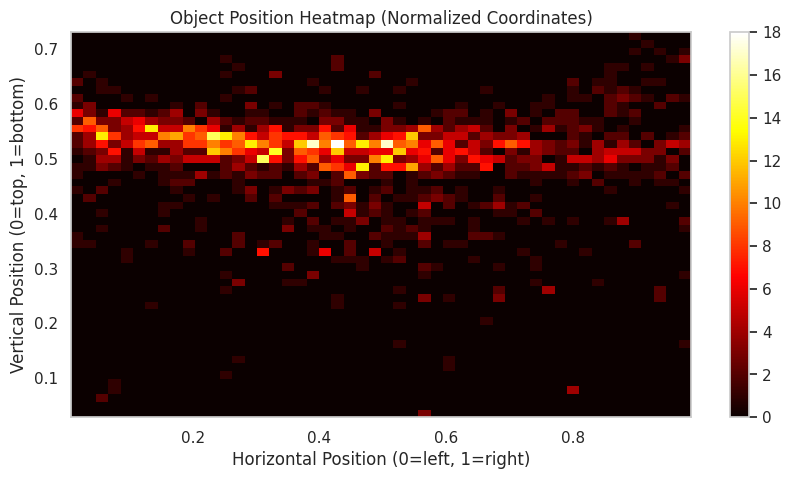


 ADVANCED METRICS


,Small Objects (<32px),Oversized Objects,Edge Cases
0,57.7%,0.0%,8.1%


In [ ]:
#Run Full Dataset Analysis
analyze_entire_dataset()

will do later after splitting if needed

# **Creating a subset for training**

In [15]:
import json
import random
import shutil
import os

# Paths
coco_json_path = 'coco_dataset/_annotations.coco.json'
subset_dir = 'coco_dataset/subset'
os.makedirs(subset_dir, exist_ok=True)

# Load original JSON
with open(coco_json_path) as f:
    coco = json.load(f)

# Subset size (e.g., 200 images)
subset_size = 3000
all_images = coco['images']
subset_images = random.sample(all_images, subset_size)
subset_image_ids = {img['id'] for img in subset_images}

# Filter annotations
subset_annotations = [ann for ann in coco['annotations'] if ann['image_id'] in subset_image_ids]

# Create new subset JSON
subset_json = {
    'info': coco['info'],
    'licenses': coco['licenses'],
    'categories': coco['categories'],
    'images': subset_images,
    'annotations': subset_annotations
}

# Save subset JSON
with open(f'{subset_dir}/annotations.coco.json', 'w') as f:
    json.dump(subset_json, f)

# Copy images to subset folder
for img in subset_images:
    shutil.copy(f"coco_dataset/export/{img['file_name']}", f"{subset_dir}/{img['file_name']}")


### **spliting dataset**

In [16]:
from sklearn.model_selection import train_test_split

train_imgs, temp_imgs = train_test_split(subset_images, train_size=0.75, random_state=42)
val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.4, random_state=42)

splits = {
    'train': train_imgs,
    'val': val_imgs,
    'test': test_imgs
}

for split, imgs in splits.items():
    split_dir = f'coco_dataset/yolo_format/images/{split}'
    os.makedirs(split_dir, exist_ok=True)
    for img in imgs:
        shutil.copy(f"{subset_dir}/{img['file_name']}", f"{split_dir}/{img['file_name']}")


# **coverting to YOLO format**

In [17]:
def coco_to_yolo_bbox(bbox, img_w, img_h):
    x, y, w, h = bbox
    x_c = (x + w / 2) / img_w
    y_c = (y + h / 2) / img_h
    w /= img_w
    h /= img_h
    return [x_c, y_c, w, h]

# Build annotations by image_id
from collections import defaultdict
anns_by_img = defaultdict(list)
for ann in subset_annotations:
    anns_by_img[ann['image_id']].append(ann)

# Export YOLO labels
for split, imgs in splits.items():
    label_dir = f'coco_dataset/yolo_format/labels/{split}'
    os.makedirs(label_dir, exist_ok=True)

    for img in imgs:
        file_name = img['file_name'].rsplit('.', 1)[0]
        label_path = f"{label_dir}/{file_name}.txt"
        lines = []

        for ann in anns_by_img[img['id']]:
            yolo_box = coco_to_yolo_bbox(ann['bbox'], img['width'], img['height'])
            line = f"{ann['category_id']} " + " ".join(map(str, yolo_box))
            lines.append(line)

        with open(label_path, 'w') as f:
            f.write("\n".join(lines))


In [ ]:
"""
required

coco_dataset/
├── yolo_format/
│   ├── images/
│   │   ├── train/
│   │   ├── val/
│   │   └── test/
│   └── labels/
│       ├── train/
│       ├── val/
│       └── test/
├── data.yaml

"""

'\nrequired \n\ncoco_dataset/\n├── yolo_format/\n│   ├── images/\n│   │   ├── train/\n│   │   ├── val/\n│   │   └── test/\n│   └── labels/\n│       ├── train/\n│       ├── val/\n│       └── test/\n├── data.yaml\n\n'

In [20]:
yaml_content = '''
path: coco_dataset/yolo_format
train: images/train
val: images/val
test: images/test

nc: 12
names:
  - obstacles
  - biker
  - car
  - pedestrian
  - trafficLight
  - trafficLight-Green
  - trafficLight-GreenLeft
  - trafficLight-Red
  - trafficLight-RedLeft
  - trafficLight-Yellow
  - trafficLight-YellowLeft
  - truck
'''

with open('/content/coco_dataset/data.yaml', 'w') as f:
    f.write(yaml_content)



In [18]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 96.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 77.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

In [21]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # Use 'yolov8s.pt', 'yolov8m.pt', etc. for larger models
model.train(
    data='/content/coco_dataset/data.yaml',
    epochs=80,
    imgsz=640,             # ↑ Increased image size (better for small objects)
    batch=16,              # Adjust based on your GPU's memory
    augment=True,          # Enable default augmentations
    patience=12,           # Early stopping if no improvement for 10 epochs
    lr0=0.001,             # Initial learning rate (try 0.01 or 0.001)
    optimizer='SGD',       # Try SGD (or 'Adam' if you want faster but less stable training)
    dropout=0.1,           # Helps regularize overfitting (optional)
    cache=True,            # Cache data for faster training
    hsv_h=0.015,           # Adjust color augmentation (Hue)
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=10,            # Random rotation
    translate=0.1,         # Image translation
    scale=0.5,             # Zoom in/out
    shear=2.0,             # Shear images
    perspective=0.0,       # Less distortion
    mosaic=1.0,            # Strong mosaic augmentation
    mixup=0.2,             # Mild mixup for regularization
    workers=8,             # Parallel data loading
    project='yolov8-training',
    name='exp_augmented_50e',
    exist_ok=True          # Avoid overwrite errors
)

Ultralytics 8.3.135 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/coco_dataset/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_augmented_50e, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=12, perspective=0.0, plots=True, pose=12.0, 

100%|██████████| 755k/755k [00:00<00:00, 17.5MB/s]

Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

Model summary: 129 layers, 3,013,188 parameters, 3,013,172 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 112MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 18.7±3.9 MB/s, size: 37.1 KB)


train: Scanning /content/coco_dataset/yolo_format/labels/train... 2250 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2250/2250 [00:05<00:00, 448.55it/s]

train: New cache created: /content/coco_dataset/yolo_format/labels/train.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (2.6GB RAM): 100%|██████████| 2250/2250 [00:08<00:00, 278.51it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 6.5±1.1 MB/s, size: 31.9 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val... 450 images, 0 backgrounds, 0 corrupt: 100%|██████████| 450/450 [00:01<00:00, 399.10it/s]


val: New cache created: /content/coco_dataset/yolo_format/labels/val.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.5GB RAM): 100%|██████████| 450/450 [00:01<00:00, 319.83it/s]


Plotting labels to yolov8-training/exp_augmented_50e/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov8-training/exp_augmented_50e
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      2.52G      1.949      3.523      1.434        156        640: 100%|██████████| 141/141 [00:47<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.94it/s]


                   all        450       3223      0.882     0.0514     0.0583     0.0289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80       2.7G      1.788      2.309      1.361        135        640: 100%|██████████| 141/141 [00:39<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]

                   all        450       3223      0.844     0.0707      0.105     0.0494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      2.71G      1.748      1.915      1.351        124        640: 100%|██████████| 141/141 [00:39<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.92it/s]

                   all        450       3223      0.647      0.187      0.171     0.0734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      2.72G      1.709       1.75      1.329        115        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]

                   all        450       3223      0.504      0.272      0.209     0.0964



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      2.72G      1.671      1.648      1.311        112        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.92it/s]

                   all        450       3223      0.544      0.275      0.223      0.102



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      2.74G      1.654        1.6      1.306        170        640: 100%|██████████| 141/141 [00:39<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.96it/s]

                   all        450       3223      0.544      0.277      0.241      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      2.76G      1.642      1.573      1.295        151        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.06it/s]

                   all        450       3223      0.554        0.3      0.248      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      2.77G      1.627      1.538      1.277        146        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]

                   all        450       3223      0.581      0.301      0.268      0.124



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      2.77G      1.621      1.505      1.268        121        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.07it/s]

                   all        450       3223      0.577      0.331       0.28       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      2.79G      1.618      1.501      1.266        188        640: 100%|██████████| 141/141 [00:38<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.44it/s]

                   all        450       3223      0.578      0.337      0.283      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80       2.8G      1.601      1.477      1.253        115        640: 100%|██████████| 141/141 [00:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.22it/s]

                   all        450       3223      0.594      0.334      0.299      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      2.81G      1.593       1.45      1.246        123        640: 100%|██████████| 141/141 [00:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.25it/s]

                   all        450       3223      0.636      0.336      0.312      0.146



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80         3G      1.591      1.456       1.25         87        640: 100%|██████████| 141/141 [00:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.17it/s]

                   all        450       3223      0.624      0.351      0.311      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      3.03G       1.58      1.425      1.235        133        640: 100%|██████████| 141/141 [00:37<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.15it/s]

                   all        450       3223      0.645      0.336      0.321      0.152



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      3.04G      1.568      1.412      1.237        147        640: 100%|██████████| 141/141 [00:37<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.25it/s]


                   all        450       3223      0.627      0.357       0.33       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      3.05G      1.569      1.395      1.229        106        640: 100%|██████████| 141/141 [00:38<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.36it/s]


                   all        450       3223      0.648      0.342      0.328       0.15

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      3.05G       1.56      1.381      1.231        134        640: 100%|██████████| 141/141 [00:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.37it/s]


                   all        450       3223      0.691      0.324      0.343      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      3.07G      1.554      1.384       1.23        144        640: 100%|██████████| 141/141 [00:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.65it/s]

                   all        450       3223      0.696      0.324      0.343      0.156



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      3.08G      1.543      1.366      1.219         86        640: 100%|██████████| 141/141 [00:38<00:00,  3.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]

                   all        450       3223      0.703       0.34      0.352      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      3.09G      1.555      1.369      1.221        161        640: 100%|██████████| 141/141 [00:39<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.89it/s]


                   all        450       3223      0.693      0.328      0.358      0.173

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      3.09G      1.545      1.362      1.218        187        640: 100%|██████████| 141/141 [00:38<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.94it/s]


                   all        450       3223      0.669      0.362      0.364      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      3.12G      1.542      1.364       1.22         85        640: 100%|██████████| 141/141 [00:39<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.26it/s]


                   all        450       3223      0.717      0.352      0.375      0.175

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      3.13G      1.537      1.343      1.214        146        640: 100%|██████████| 141/141 [00:39<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.09it/s]

                   all        450       3223      0.703      0.351      0.369      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      3.14G       1.54      1.335      1.216        112        640: 100%|██████████| 141/141 [00:39<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.42it/s]

                   all        450       3223      0.699      0.363      0.375      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      3.14G      1.528      1.318      1.205        146        640: 100%|██████████| 141/141 [00:39<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.51it/s]

                   all        450       3223      0.733      0.331      0.374      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      3.16G      1.533      1.321      1.208         86        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.41it/s]

                   all        450       3223      0.701      0.344      0.381      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      3.17G      1.532      1.316      1.208        135        640: 100%|██████████| 141/141 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.33it/s]

                   all        450       3223      0.683      0.363      0.376      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      3.19G      1.529      1.304      1.205        138        640: 100%|██████████| 141/141 [00:39<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.20it/s]

                   all        450       3223      0.731      0.353      0.381       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      3.19G      1.523      1.306      1.206        109        640: 100%|██████████| 141/141 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.18it/s]

                   all        450       3223      0.712       0.36      0.388      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      3.21G       1.51      1.288      1.197         93        640: 100%|██████████| 141/141 [00:39<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]

                   all        450       3223      0.706      0.362      0.382       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      3.22G      1.514      1.288      1.197         96        640: 100%|██████████| 141/141 [00:39<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]

                   all        450       3223      0.729      0.345      0.392      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      3.23G       1.51      1.278      1.193        172        640: 100%|██████████| 141/141 [00:39<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.41it/s]

                   all        450       3223      0.709      0.378      0.405      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      3.23G      1.515       1.28      1.197         98        640: 100%|██████████| 141/141 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.06it/s]

                   all        450       3223      0.708       0.37        0.4      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      3.25G      1.503      1.257       1.19        104        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.23it/s]

                   all        450       3223      0.732      0.369        0.4      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      3.27G      1.503      1.262       1.19         87        640: 100%|██████████| 141/141 [00:39<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.14it/s]

                   all        450       3223      0.729      0.379      0.402      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      3.28G      1.503      1.264      1.192         70        640: 100%|██████████| 141/141 [00:39<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.82it/s]

                   all        450       3223      0.724      0.372      0.411        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      3.28G      1.506      1.258      1.188        133        640: 100%|██████████| 141/141 [00:40<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.29it/s]

                   all        450       3223      0.728      0.383      0.405      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80       3.3G      1.485      1.245       1.19         77        640: 100%|██████████| 141/141 [00:38<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.60it/s]

                   all        450       3223      0.735      0.375      0.409      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      3.31G      1.484      1.239      1.185        152        640: 100%|██████████| 141/141 [00:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.37it/s]

                   all        450       3223      0.723      0.395      0.414      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      3.32G      1.496      1.239      1.185        140        640: 100%|██████████| 141/141 [00:38<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.30it/s]

                   all        450       3223      0.706      0.388      0.408      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      3.32G      1.497      1.234      1.191        150        640: 100%|██████████| 141/141 [00:37<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.04it/s]

                   all        450       3223      0.725      0.388      0.414      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      3.35G      1.491      1.244      1.184         97        640: 100%|██████████| 141/141 [00:37<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.14it/s]

                   all        450       3223      0.718      0.393      0.416      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      3.36G      1.477      1.231      1.182        132        640: 100%|██████████| 141/141 [00:38<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.18it/s]

                   all        450       3223      0.745       0.39      0.416      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      3.37G      1.498      1.243       1.19        136        640: 100%|██████████| 141/141 [00:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.08it/s]

                   all        450       3223      0.712      0.401      0.422      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      3.37G      1.491      1.223      1.182         87        640: 100%|██████████| 141/141 [00:37<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.38it/s]


                   all        450       3223      0.727      0.398      0.431      0.207

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      3.39G      1.483      1.226       1.18         91        640: 100%|██████████| 141/141 [00:38<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.41it/s]


                   all        450       3223      0.733      0.385      0.422      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80       3.4G      1.497      1.231      1.186         96        640: 100%|██████████| 141/141 [00:38<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.49it/s]


                   all        450       3223       0.74      0.398       0.42       0.21

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      3.41G      1.472      1.215      1.176         89        640: 100%|██████████| 141/141 [00:38<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.54it/s]


                   all        450       3223      0.758      0.376      0.421      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80      3.41G      1.481      1.218      1.179        156        640: 100%|██████████| 141/141 [00:38<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.88it/s]


                   all        450       3223      0.722       0.41      0.435      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      3.44G      1.481      1.216      1.181         90        640: 100%|██████████| 141/141 [00:38<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.30it/s]

                   all        450       3223      0.752      0.386      0.424      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      3.45G      1.482      1.222      1.179        152        640: 100%|██████████| 141/141 [00:39<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]

                   all        450       3223      0.752      0.398      0.435      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      3.46G      1.477       1.21      1.174        144        640: 100%|██████████| 141/141 [00:40<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.39it/s]

                   all        450       3223      0.737       0.39      0.429      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80      3.46G      1.478      1.208      1.183        127        640: 100%|██████████| 141/141 [00:39<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.11it/s]

                   all        450       3223       0.76      0.381      0.439       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      3.48G      1.464      1.195      1.168         88        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.45it/s]

                   all        450       3223      0.747      0.393      0.436      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      3.49G      1.477      1.199      1.178        173        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.22it/s]

                   all        450       3223      0.767       0.39      0.436      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80       3.5G      1.464      1.187       1.17        119        640: 100%|██████████| 141/141 [00:39<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.18it/s]

                   all        450       3223      0.752      0.386      0.436       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      3.51G      1.466      1.184      1.175        171        640: 100%|██████████| 141/141 [00:39<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.45it/s]

                   all        450       3223      0.755      0.393      0.436       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      3.53G      1.479      1.197      1.172        123        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.26it/s]

                   all        450       3223      0.762      0.388      0.435      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      3.54G      1.468      1.187      1.175         80        640: 100%|██████████| 141/141 [00:39<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.31it/s]

                   all        450       3223      0.733      0.408      0.433      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      3.55G      1.464      1.175      1.168        120        640: 100%|██████████| 141/141 [00:40<00:00,  3.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.37it/s]

                   all        450       3223      0.738      0.395      0.435       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      3.55G      1.469      1.182      1.168        142        640: 100%|██████████| 141/141 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.33it/s]

                   all        450       3223      0.747      0.404      0.441      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      3.57G      1.459       1.19      1.171         98        640: 100%|██████████| 141/141 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.40it/s]

                   all        450       3223      0.767      0.385      0.442      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      3.58G      1.453      1.169      1.162         99        640: 100%|██████████| 141/141 [00:39<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.97it/s]

                   all        450       3223      0.744      0.394      0.447      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80       3.6G      1.457      1.175      1.169        125        640: 100%|██████████| 141/141 [00:39<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.83it/s]

                   all        450       3223      0.749      0.389      0.442      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80       3.6G      1.467       1.18      1.169        110        640: 100%|██████████| 141/141 [00:39<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.02it/s]

                   all        450       3223      0.735      0.404      0.437      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      3.62G      1.465      1.175      1.169         93        640: 100%|██████████| 141/141 [00:39<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.41it/s]

                   all        450       3223      0.753      0.394       0.45      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80      3.63G      1.444      1.165       1.16        146        640: 100%|██████████| 141/141 [00:38<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.39it/s]

                   all        450       3223      0.746      0.401      0.452       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      3.64G      1.462       1.18      1.165        117        640: 100%|██████████| 141/141 [00:38<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.19it/s]

                   all        450       3223      0.741      0.404      0.451      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      3.64G      1.447      1.165      1.163         68        640: 100%|██████████| 141/141 [00:37<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.08it/s]

                   all        450       3223      0.753      0.398      0.447      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      3.66G      1.444      1.166      1.163        123        640: 100%|██████████| 141/141 [00:37<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.54it/s]


                   all        450       3223      0.753      0.403      0.449       0.23
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80      3.68G      1.397      1.164      1.136         45        640: 100%|██████████| 141/141 [00:34<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.61it/s]

                   all        450       3223      0.759      0.386      0.437      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      3.69G      1.388      1.126      1.131         74        640: 100%|██████████| 141/141 [00:33<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.58it/s]

                   all        450       3223      0.754      0.399      0.439      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      3.69G      1.384      1.124      1.135         55        640: 100%|██████████| 141/141 [00:32<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.68it/s]

                   all        450       3223      0.755      0.399      0.444      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      3.71G      1.384      1.107      1.132         79        640: 100%|██████████| 141/141 [00:32<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.66it/s]

                   all        450       3223      0.746      0.411       0.45      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80      3.72G      1.387      1.109      1.137         59        640: 100%|██████████| 141/141 [00:32<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.39it/s]

                   all        450       3223      0.755      0.403      0.448      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      3.73G      1.381      1.103      1.131         92        640: 100%|██████████| 141/141 [00:34<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.23it/s]

                   all        450       3223      0.737      0.412      0.446      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      3.73G      1.376      1.103      1.131         73        640: 100%|██████████| 141/141 [00:33<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.28it/s]


                   all        450       3223      0.738      0.411      0.448      0.229

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      3.76G      1.376      1.097      1.132         67        640: 100%|██████████| 141/141 [00:33<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  4.22it/s]

                   all        450       3223      0.745        0.4      0.448      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      3.77G      1.376      1.099      1.126         62        640: 100%|██████████| 141/141 [00:32<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:03<00:00,  3.78it/s]


                   all        450       3223      0.762      0.394       0.45      0.228
EarlyStopping: Training stopped early as no improvement observed in last 12 epochs. Best results observed at epoch 67, best model saved as best.pt.
To update EarlyStopping(patience=12) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

79 epochs completed in 0.941 hours.
Optimizer stripped from yolov8-training/exp_augmented_50e/weights/last.pt, 6.3MB
Optimizer stripped from yolov8-training/exp_augmented_50e/weights/best.pt, 6.3MB

Validating yolov8-training/exp_augmented_50e/weights/best.pt...
Ultralytics 8.3.135 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:08<00:00,  1.76it/s]


                   all        450       3223      0.758      0.393      0.447      0.222
                 biker         36         53       0.52      0.434      0.503      0.245
                   car        434       2088      0.773      0.766      0.813      0.492
            pedestrian        121        410      0.642      0.459      0.519      0.213
          trafficLight         52         84      0.544      0.464      0.548      0.278
    trafficLight-Green         62        177      0.617      0.409       0.47      0.171
trafficLight-GreenLeft          5          8          1          0     0.0689     0.0465
      trafficLight-Red        101        236      0.755      0.627      0.692      0.291
  trafficLight-RedLeft         40         51      0.676      0.451      0.495      0.205
   trafficLight-Yellow          4          9          1          0     0.0158    0.00296
trafficLight-YellowLeft          1          1          1          0          0          0
                 tru

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x787c746f5f90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

# **evaluation matrics**

In [22]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)


Ultralytics 8.3.135 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 61.4±105.6 MB/s, size: 38.5 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<00:00, 491.18it/s]

val: New cache created: /content/coco_dataset/yolo_format/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:07<00:00,  2.66it/s]


                   all        300       2101      0.713      0.427      0.475      0.241
                 biker         28         38      0.556      0.316      0.402      0.184
                   car        292       1409      0.808       0.78      0.825      0.496
            pedestrian         72        218      0.554      0.491      0.504      0.208
          trafficLight         26         40        0.4      0.475      0.405      0.219
    trafficLight-Green         39        113      0.621      0.496      0.532      0.202
trafficLight-GreenLeft          5          7          1          0      0.149     0.0891
      trafficLight-Red         54        152      0.782      0.559      0.661      0.328
  trafficLight-RedLeft         25         37        0.7      0.504      0.571       0.28
   trafficLight-Yellow          3          8          1          0     0.0196    0.00672
                 truck         54         79      0.709      0.646      0.676      0.401
Speed: 1.8ms preproce

In [23]:
metrics = model.val(data='coco_dataset/data.yaml', split='val')


Ultralytics 8.3.135 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1156.2±283.6 MB/s, size: 43.4 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val.cache... 450 images, 0 backgrounds, 0 corrupt: 100%|██████████| 450/450 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:07<00:00,  3.86it/s]


                   all        450       3223       0.74      0.405      0.452      0.231
                 biker         36         53      0.589      0.396      0.517      0.282
                   car        434       2088       0.76      0.775      0.813      0.492
            pedestrian        121        410      0.624      0.495      0.516      0.217
          trafficLight         52         84      0.484      0.569       0.52      0.267
    trafficLight-Green         62        177      0.571      0.444      0.474      0.159
trafficLight-GreenLeft          5          8          1          0      0.129     0.0897
      trafficLight-Red        101        236       0.73       0.63      0.689      0.298
  trafficLight-RedLeft         40         51      0.575      0.431      0.496      0.221
   trafficLight-Yellow          4          9          1          0       0.02    0.00303
trafficLight-YellowLeft          1          1          1          0          0          0
                 tru

In [24]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)



image 1/300 /content/coco_dataset/yolo_format/images/test/1478020194690266730_jpg.rf.72qBTRDOXj3DoiqDj9Tt.jpg: 640x640 2 cars, 9.8ms
image 2/300 /content/coco_dataset/yolo_format/images/test/1478020292192550265_jpg.rf.bNusJcrux9If00NDKfLC.jpg: 640x640 2 cars, 1 trafficLight, 2 trafficLight-Reds, 7.4ms
image 3/300 /content/coco_dataset/yolo_format/images/test/1478020299691687122_jpg.rf.rIGmcSRh5gzlrxt5aFsk.jpg: 640x640 1 car, 1 trafficLight, 2 trafficLight-Reds, 7.4ms
image 4/300 /content/coco_dataset/yolo_format/images/test/1478020320192461472_jpg.rf.O73t3LDM7aOrKeZ2LAlE.jpg: 640x640 1 car, 3 trafficLight-Greens, 7.4ms
image 5/300 /content/coco_dataset/yolo_format/images/test/1478020390196268259_jpg.rf.d83107dacc7ec4fa2269f558d2f6902f.jpg: 640x640 1 biker, 4 pedestrians, 2 trafficLight-Reds, 7.4ms
image 6/300 /content/coco_dataset/yolo_format/images/test/1478020400202877340_jpg.rf.OR1PRnRWn3Zxt5tCB5Qf.jpg: 640x640 2 trafficLights, 7.4ms
image 7/300 /content/coco_dataset/yolo_format/im

In [25]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt


In [26]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)

Ultralytics 8.3.135 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,007,988 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 871.0±144.5 MB/s, size: 33.6 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test.cache... 300 images, 0 backgrounds, 0 corrupt: 100%|██████████| 300/300 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.72it/s]


                   all        300       2101      0.713      0.427      0.475      0.241
                 biker         28         38      0.556      0.316      0.402      0.184
                   car        292       1409      0.808       0.78      0.825      0.496
            pedestrian         72        218      0.554      0.491      0.504      0.208
          trafficLight         26         40        0.4      0.475      0.405      0.219
    trafficLight-Green         39        113      0.621      0.496      0.532      0.202
trafficLight-GreenLeft          5          7          1          0      0.149     0.0891
      trafficLight-Red         54        152      0.782      0.559      0.661      0.328
  trafficLight-RedLeft         25         37        0.7      0.504      0.571       0.28
   trafficLight-Yellow          3          8          1          0     0.0196    0.00672
                 truck         54         79      0.709      0.646      0.676      0.401
Speed: 2.8ms preproce

In [27]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)


image 1/300 /content/coco_dataset/yolo_format/images/test/1478020194690266730_jpg.rf.72qBTRDOXj3DoiqDj9Tt.jpg: 640x640 2 cars, 9.4ms
image 2/300 /content/coco_dataset/yolo_format/images/test/1478020292192550265_jpg.rf.bNusJcrux9If00NDKfLC.jpg: 640x640 2 cars, 1 trafficLight, 2 trafficLight-Reds, 7.4ms
image 3/300 /content/coco_dataset/yolo_format/images/test/1478020299691687122_jpg.rf.rIGmcSRh5gzlrxt5aFsk.jpg: 640x640 1 car, 1 trafficLight, 2 trafficLight-Reds, 8.1ms
image 4/300 /content/coco_dataset/yolo_format/images/test/1478020320192461472_jpg.rf.O73t3LDM7aOrKeZ2LAlE.jpg: 640x640 1 car, 3 trafficLight-Greens, 7.4ms
image 5/300 /content/coco_dataset/yolo_format/images/test/1478020390196268259_jpg.rf.d83107dacc7ec4fa2269f558d2f6902f.jpg: 640x640 1 biker, 4 pedestrians, 2 trafficLight-Reds, 7.4ms
image 6/300 /content/coco_dataset/yolo_format/images/test/1478020400202877340_jpg.rf.OR1PRnRWn3Zxt5tCB5Qf.jpg: 640x640 2 trafficLights, 7.4ms
image 7/300 /content/coco_dataset/yolo_format/im

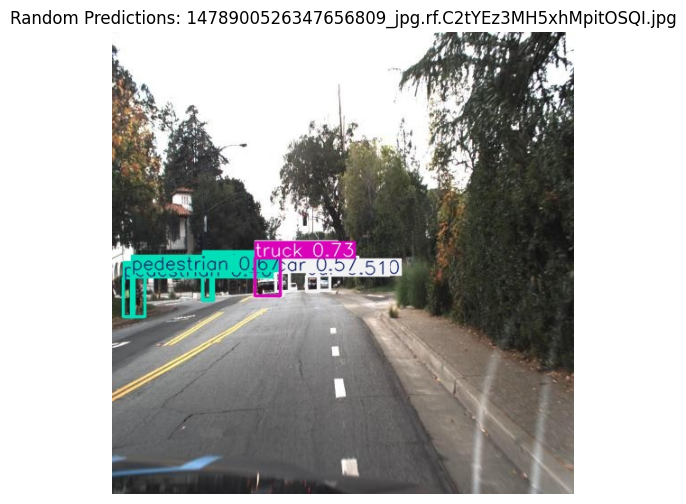

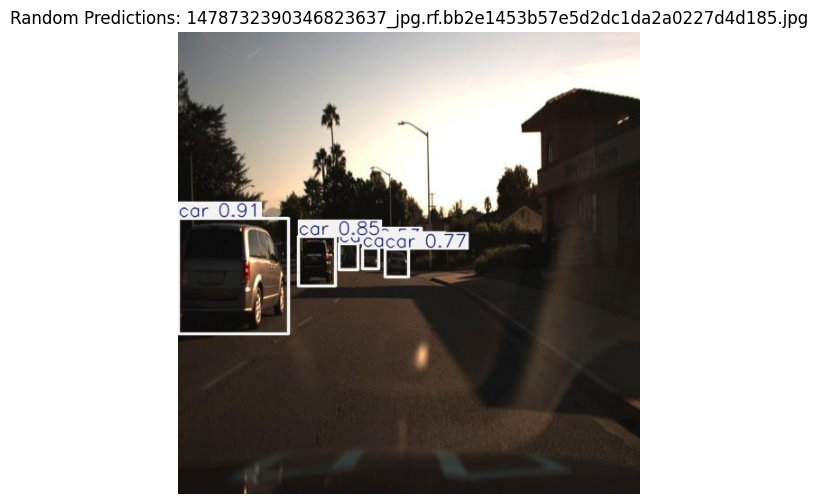

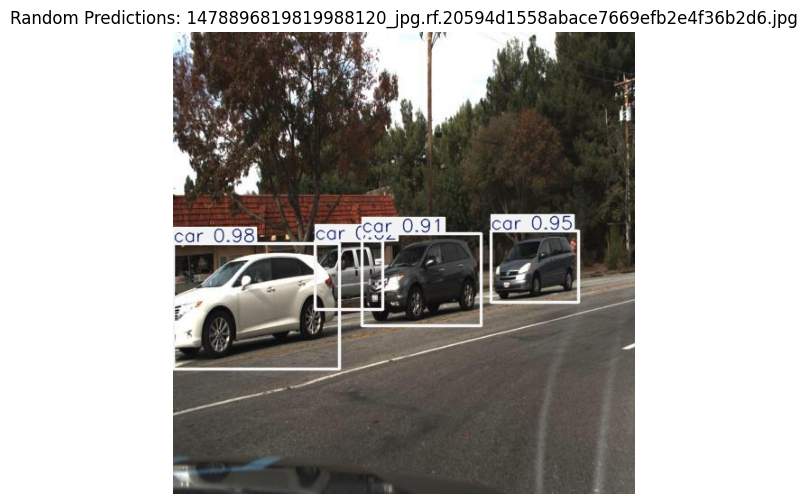

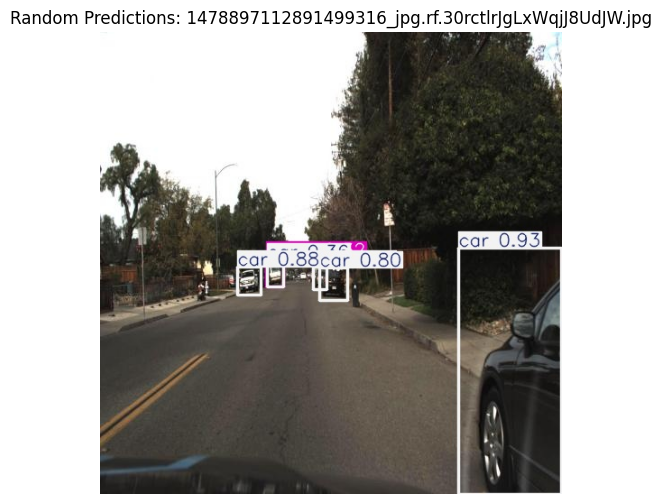

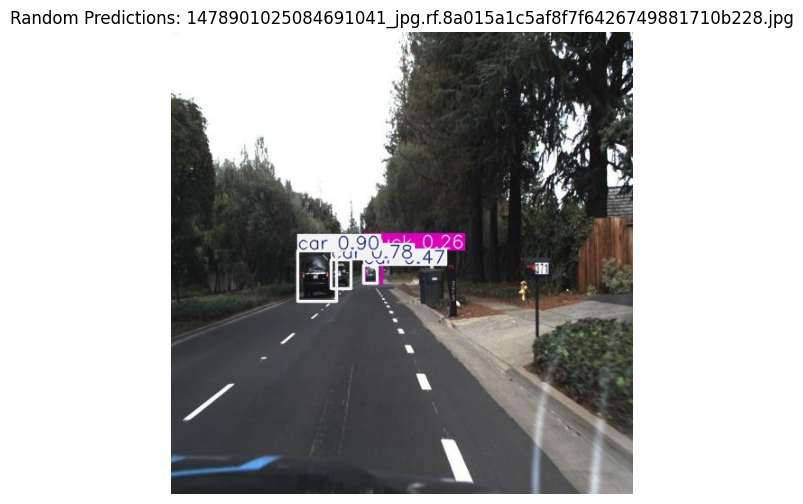

...

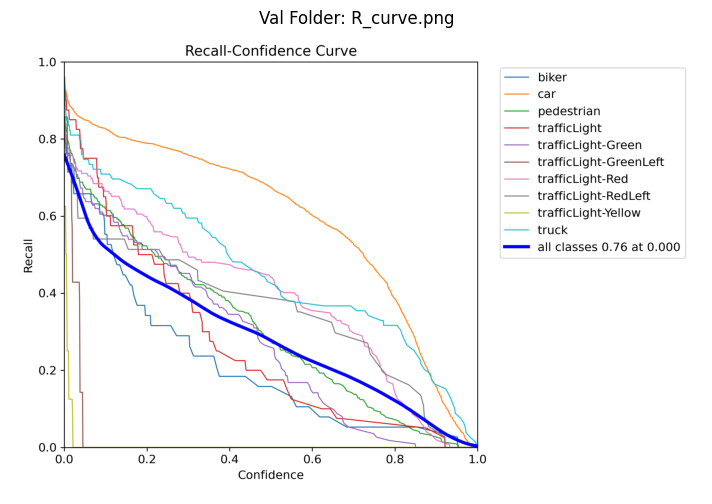

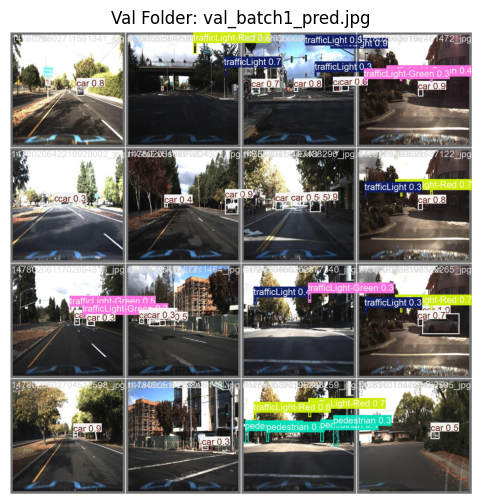

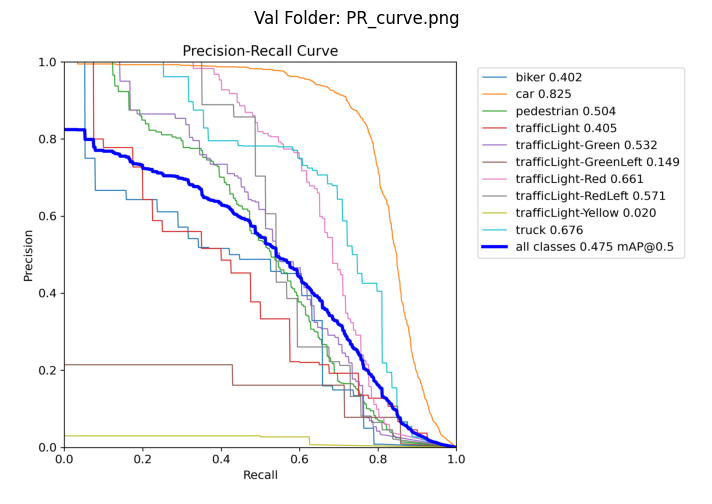

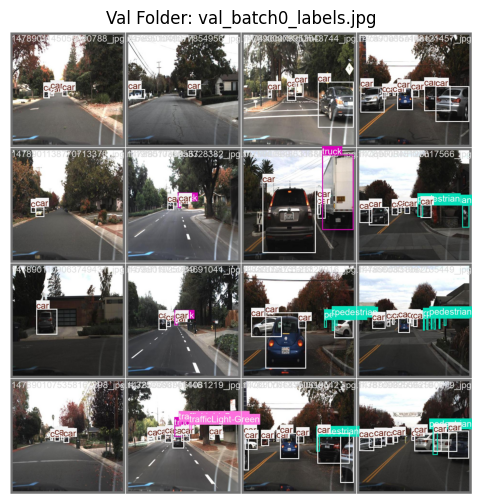

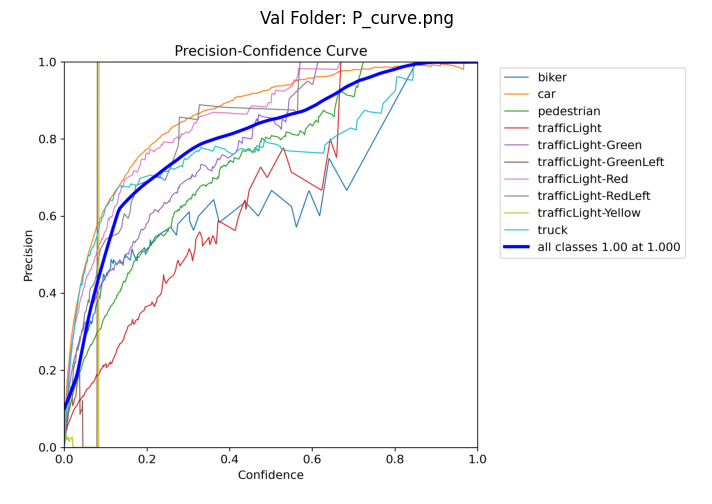

In [33]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def display_random_images(folder_path, title, num_images=30):
    if not os.path.exists(folder_path):
        print(f"Folder '{folder_path}' does not exist.")
        return

    # Get all image files
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        print(f"No images found in '{folder_path}'.")
        return

    # Select random subset if there are more images than requested
    if len(image_files) > num_images:
        image_files = random.sample(image_files, num_images)

    # Display each selected image
    for file in image_files:
        img_path = os.path.join(folder_path, file)
        img = Image.open(img_path)

        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title(f"{title}: {file}")
        plt.axis('off')
        plt.show()

# Display 30 random images from predict2 folder
display_random_images('/content/runs/detect/predict2', 'Random Predictions', 30)

display_images_one_by_one('/content/runs/detect/val3', 'Val Folder')

# **EXPORT MODEL**

In [29]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt


In [30]:
import os
import shutil
import zipfile

# Paths
model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'
new_folder = 'yolov8-models'
zip_path = 'yolov8-models.zip'

# Check if the model exists
if os.path.exists(model_path):
    print("✅ Model found:", model_path)

    # Create the new folder if it doesn't exist
    if not os.path.exists(new_folder):
        os.makedirs(new_folder)

    # Move the model to the new folder
    new_model_path = os.path.join(new_folder, 'best.pt')
    shutil.move(model_path, new_model_path)
    print(f"✅ Model moved to: {new_model_path}")

    # Zip the new folder
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(new_folder):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), new_folder))
    print(f"✅ Folder zipped to: {zip_path}")
else:
    print("❌ Model NOT found:", model_path)


✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt
✅ Model moved to: yolov8-models/best.pt
✅ Folder zipped to: yolov8-models.zip
